# Importing the essential Libraries

In [2]:
# Required imports
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models
import cv2
import os
import glob
from tqdm import tqdm
import scipy.io as sio
from sklearn.metrics import precision_recall_curve, average_precision_score

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


# Downloading the dataset

In [3]:
import urllib.request
import tarfile
import os

def download_and_extract_dataset():
    dataset_url = "https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
    tgz_file = "BSR_bsds500.tgz"
    
    if not os.path.exists('BSR'):
        print("Downloading BSDS500 dataset...")
        urllib.request.urlretrieve(dataset_url, tgz_file)
        
        print("Extracting dataset...")
        with tarfile.open(tgz_file, 'r:gz') as tar:
            tar.extractall()
        print("Dataset extracted successfully!")

# Call the function to download and extract the dataset
download_and_extract_dataset()


Extracting dataset...
Dataset extracted successfully!


# Defining the BSDS500 to make the dataset ready for training the model

In [4]:
# Define paths
data_dir = 'BSR/BSDS500/data'
images_dir = os.path.join(data_dir, 'images')
gt_dir = os.path.join(data_dir, 'groundTruth')

# Define BSDS500 Dataset class
class BSDS500Dataset(Dataset):
    def __init__(self, split='train', transform=None, target_size=(320, 320)):
        self.split = split
        self.transform = transform
        self.target_size = target_size
        self.img_paths = glob.glob(os.path.join(images_dir, split, '*.jpg'))
        self.gt_paths = [os.path.join(gt_dir, split, os.path.basename(p).split('.')[0] + '.mat') 
                         for p in self.img_paths]
    
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        # Load image
        img_path = self.img_paths[idx]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Resize image to target size
        img = cv2.resize(img, self.target_size)
        
        # Load ground truth edges
        gt_path = self.gt_paths[idx]
        gt_data = sio.loadmat(gt_path)
        
        # Get ground truth boundaries and resize them
        num_annotators = gt_data['groundTruth'].shape[1]
        gt_edges = np.zeros((self.target_size[1], self.target_size[0]), dtype=np.float32)

        for i in range(num_annotators):
            boundaries = gt_data['groundTruth'][0, i]['Boundaries'][0, 0]
            boundaries = cv2.resize(boundaries.astype(np.float32), self.target_size)
            gt_edges += boundaries
        
        gt_edges = (gt_edges > 0).astype(np.float32)  # Binarize
        
        # Apply transformations
        if self.transform:
            img = self.transform(img)
            
        # Convert ground truth to tensor
        gt_edges = torch.from_numpy(gt_edges).float().unsqueeze(0)  # Add channel dimension

        return img, gt_edges


# Defining the Image transformations to be applied, and creating datasets and dataloaders

In [5]:
# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets and dataloaders
train_dataset = BSDS500Dataset(split='train', transform=transform)
val_dataset = BSDS500Dataset(split='val', transform=transform)
test_dataset = BSDS500Dataset(split='test', transform=transform)

batch_size = 4

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)

# VGG16-based Edge Detection Model with transpose convolution

In [5]:
# Define the VGG16-based Edge Detection Model with transpose convolution
class VGG16EdgeDetection(nn.Module):
    def __init__(self, use_bilinear=False):
        super(VGG16EdgeDetection, self).__init__()
        
        # Load pretrained VGG16 model
        vgg16 = models.vgg16(pretrained=True)
        
        # Get feature layers up to the last pooling layer (excluding it)
        features = list(vgg16.features.children())[:-1]
        self.features = nn.Sequential(*features)
        
        # Upsampling method: transpose convolution or bilinear interpolation
        self.use_bilinear = use_bilinear
        
        if not use_bilinear:
            # Transpose convolution to upsample feature maps back to original size
            # 512 -> 256
            self.upconv1 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu1 = nn.ReLU(inplace=True)
            
            # 256 -> 128
            self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu2 = nn.ReLU(inplace=True)
            
            # 128 -> 64
            self.upconv3 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu3 = nn.ReLU(inplace=True)
            
            # 64 -> 32
            self.upconv4 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu4 = nn.ReLU(inplace=True)
        else:
            # Use convolutional layers after bilinear upsampling
            self.conv1 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
            self.relu1 = nn.ReLU(inplace=True)
            
            self.conv2 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
            self.relu2 = nn.ReLU(inplace=True)
            
            self.conv3 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
            self.relu3 = nn.ReLU(inplace=True)
            
            self.conv4 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
            self.relu4 = nn.ReLU(inplace=True)

        # Final convolution to output edge map
        self.final_conv = nn.Conv2d(32, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # Original input size for reference
        input_size = x.size()[2:]
        
        # Extract features using VGG16
        features = self.features(x)
        
        if not self.use_bilinear:
            # Upsample using transpose convolutions
            x = self.relu1(self.upconv1(features))
            x = self.relu2(self.upconv2(x))
            x = self.relu3(self.upconv3(x))
            x = self.relu4(self.upconv4(x))
        else:
            # Upsample using bilinear interpolation + conv
            x = self.relu1(self.conv1(features))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
            
            x = self.relu2(self.conv2(x))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
            
            x = self.relu3(self.conv3(x))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
            
            x = self.relu4(self.conv4(x))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)

        # Final adjustment to match input size exactly (if needed)
        if x.size()[2:] != input_size:
            x = nn.functional.interpolate(x, size=input_size, mode='bilinear', align_corners=True)
        
        # Final convolution and sigmoid to get edge probabilities
        x = self.sigmoid(self.final_conv(x))
        
        return x

# Implementing Class-balanced cross-entropy loss from HED paper

In [6]:
# Implement class-balanced cross-entropy loss as mentioned in the HED paper
class ClassBalancedCELoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        super(ClassBalancedCELoss, self).__init__()
        self.epsilon = epsilon  # Small constant to avoid log(0)
    
    def forward(self, pred, target):
        # Calculate class balance weights based on the formula
        # β = |Y-|/|Y| and 1-β = |Y+|/|Y|
        num_pos = torch.sum(target)
        num_neg = torch.sum(1.0 - target)
        total = num_pos + num_neg
        
        beta = num_neg / total      # Weight for negative samples (non-edges)
        one_minus_beta = num_pos / total  # Weight for positive samples (edges)
        
        # Create weight tensor with appropriate values
        weights = torch.zeros_like(target)
        weights[target > 0] = beta  # Edge pixels get weight β
        weights[target <= 0] = one_minus_beta  # Non-edge pixels get weight (1-β)

        # Binary cross-entropy loss terms
        loss = -weights * (
            target * torch.log(pred + self.epsilon) + 
            (1.0 - target) * torch.log(1.0 - pred + self.epsilon)
        )
        
        return torch.mean(loss)

# Setting threshold as 50, and coding the training function for the model

In [7]:
# Function to apply threshold to binarize edge predictions
def apply_threshold(edge_predictions, threshold=0.5):
    binary_edges = (edge_predictions > threshold).float()
    return binary_edges

# Training function
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=100, patience=5):
    train_losses = []
    val_losses = []

    best_val_loss = float('inf')  # Initialize best_val_loss here
    patience_counter = 0
    best_model_state = None
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0

        for inputs, targets in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Training'):
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)

        train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(train_loss)
        
        # Validation phase
        model.eval()
        running_loss = 0.0
        
        with torch.no_grad():
            for inputs, targets in tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Validation'):
                inputs, targets = inputs.to(device), targets.to(device)
                
                # Forward pass
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                
                running_loss += loss.item() * inputs.size(0)

        val_loss = running_loss / len(val_loader.dataset)
        val_losses.append(val_loss)
        
        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # Save the best model
            best_model_state = model.state_dict()
        else:
            patience_counter += 1
            print(f'EarlyStopping counter: {patience_counter} out of {patience}')
            
        if patience_counter >= patience:
            print(f'Early stopping triggered after {epoch+1} epochs')
            # Restore best model
            model.load_state_dict(best_model_state)
            break
    
    return train_losses, val_losses

# To evaluate our edge detection results

In [8]:
# Function to evaluate edge detection results
def evaluate_model(model, dataloader, threshold=0.5):
    model.eval()
    all_precision = []
    all_recall = []
    all_ap = []
    
    with torch.no_grad():
        for inputs, targets in tqdm(dataloader, desc='Evaluating'):
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            outputs = model(inputs)
            
            # Calculate metrics for each image in batch
            for i in range(inputs.size(0)):
                pred = outputs[i, 0].cpu().numpy()
                target = targets[i, 0].cpu().numpy()

                # Calculate precision-recall curve
                precision, recall, _ = precision_recall_curve(target.flatten(), pred.flatten())
                ap = average_precision_score(target.flatten(), pred.flatten())
                
                all_precision.append(precision)
                all_recall.append(recall)
                all_ap.append(ap)
    
    avg_ap = np.mean(all_ap)
    return all_precision, all_recall, all_ap, avg_ap

# Function to visualize edge detection results

In [6]:
# Function to visualize edge detection results
def visualize_results(model, dataloader, num_samples=5, threshold=0.5):
    model.eval()
    
    # Get some sample images
    dataiter = iter(dataloader)
    images, targets = next(dataiter)
    
    # Limit to requested number of samples (ensure we don't exceed batch size)
    actual_samples = min(num_samples, images.size(0))
    images = images[:actual_samples]
    targets = targets[:actual_samples]
    
    # Generate predictions
    with torch.no_grad():
        outputs = model(images.to(device))
        binary_outputs = apply_threshold(outputs, threshold)

    # Plot results
    fig, axes = plt.subplots(actual_samples, 3, figsize=(15, 5*actual_samples), squeeze=False)
    
    for i in range(actual_samples):
        # Original image
        img = images[i].cpu().permute(1, 2, 0).numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        
        # Ground truth
        gt = targets[i, 0].cpu().numpy()

        # Prediction
        pred = binary_outputs[i, 0].cpu().numpy()
        
        # Plot
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt, cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred, cmap='gray')
        axes[i, 2].set_title(f'VGG16 Prediction (th={threshold})')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    

# Comparison between tranpose convolution and bilinear upsampling

In [10]:
# Compare transpose convolution vs bilinear upsampling
def compare_upsampling_methods():
    # Create two models to compare
    model_transconv = VGG16EdgeDetection(use_bilinear=False).to(device)
    model_bilinear = VGG16EdgeDetection(use_bilinear=True).to(device)
    
    # Loss function
    criterion = ClassBalancedCELoss()
    
    # Train both models for a few epochs
    epochs = 10  # Use fewer epochs for comparison
    
    # Transpose Convolution model
    tc_optimizer = optim.Adam(model_transconv.parameters(), lr=1e-4)
    tc_train_losses, tc_val_losses = train_model(
        model_transconv, train_loader, val_loader, criterion, tc_optimizer, num_epochs=epochs, patience=5
    )

    # Bilinear Upsampling model
    bl_optimizer = optim.Adam(model_bilinear.parameters(), lr=1e-4)
    bl_train_losses, bl_val_losses = train_model(
        model_bilinear, train_loader, val_loader, criterion, bl_optimizer, num_epochs=epochs, patience=5
    )
    
    # Plot losses for comparison
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.plot(tc_train_losses, label='TransConv - Train')
    plt.plot(tc_val_losses, label='TransConv - Val')
    plt.plot(bl_train_losses, label='Bilinear - Train')
    plt.plot(bl_val_losses, label='Bilinear - Val')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()
    plt.grid(True)

    # Evaluate both models
    tc_precision, tc_recall, tc_ap, tc_avg_ap = evaluate_model(model_transconv, val_loader)
    bl_precision, bl_recall, bl_ap, bl_avg_ap = evaluate_model(model_bilinear, val_loader)
    
    # Plot average precision comparison
    plt.subplot(1, 2, 2)
    plt.bar(['Transpose Conv', 'Bilinear'], [tc_avg_ap, bl_avg_ap])
    plt.ylabel('Average Precision')
    plt.title('Upsampling Method Comparison')
    
    plt.tight_layout()
    plt.show()
    
    print(f"TransConv AP: {tc_avg_ap:.4f}, Bilinear AP: {bl_avg_ap:.4f}")
    
    return model_transconv if tc_avg_ap > bl_avg_ap else model_bilinear

# Main function to connect all the above defined functions into a single pipeline

In [11]:
# Main execution
def main():
    # First compare upsampling methods and select the better one
    print("Comparing upsampling methods...")
    best_model = compare_upsampling_methods()
    torch.save(best_model.state_dict(), 'training.pth')
    # Train the best model for more epochs
    print("Training the best model for 100 epochs...")
    optimizer = optim.Adam(best_model.parameters(), lr=1e-4)
    criterion = ClassBalancedCELoss() 
    train_losses, val_losses = train_model(best_model, train_loader, val_loader, criterion, optimizer, num_epochs=100, patience=10)
    
    # Plot training and validation losses
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Evaluate the model
    _, _, _, avg_ap = evaluate_model(best_model, val_loader)
    print(f"Average Precision on validation set: {avg_ap:.4f}")
    
    # Visualize results with thresholding
    for threshold in [0.3, 0.5, 0.7]:
        print(f"Visualizing results with threshold = {threshold}")
        visualize_results(best_model, val_loader, threshold=threshold)
    
    # Save the model
    torch.save(best_model.state_dict(), 'vgg16_edge_detector.pth')
    print("Model saved.")

Comparing upsampling methods...


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 238MB/s] 
Epoch 1/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.38it/s]


Epoch 1/10, Train Loss: 0.1311, Val Loss: 0.1324


Epoch 2/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.10it/s]


Epoch 2/10, Train Loss: 0.1195, Val Loss: 0.1182


Epoch 3/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.27it/s]


Epoch 3/10, Train Loss: 0.1058, Val Loss: 0.1125


Epoch 4/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.99it/s]


Epoch 4/10, Train Loss: 0.0995, Val Loss: 0.1096


Epoch 5/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.14it/s]


Epoch 5/10, Train Loss: 0.0933, Val Loss: 0.1087


Epoch 6/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.38it/s]


Epoch 6/10, Train Loss: 0.0897, Val Loss: 0.1114
EarlyStopping counter: 1 out of 5


Epoch 7/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.34it/s]


Epoch 7/10, Train Loss: 0.0843, Val Loss: 0.1077


Epoch 8/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.01it/s]


Epoch 8/10, Train Loss: 0.0825, Val Loss: 0.1098
EarlyStopping counter: 1 out of 5


Epoch 9/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.14it/s]


Epoch 9/10, Train Loss: 0.0781, Val Loss: 0.1138
EarlyStopping counter: 2 out of 5


Epoch 10/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.18it/s]


Epoch 10/10, Train Loss: 0.0730, Val Loss: 0.1131
EarlyStopping counter: 3 out of 5


Epoch 1/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.78it/s]


Epoch 1/10, Train Loss: 0.1264, Val Loss: 0.1223


Epoch 2/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.78it/s]


Epoch 2/10, Train Loss: 0.1107, Val Loss: 0.1239
EarlyStopping counter: 1 out of 5


Epoch 3/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.47it/s]


Epoch 3/10, Train Loss: 0.1058, Val Loss: 0.1171


Epoch 4/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.78it/s]


Epoch 4/10, Train Loss: 0.1014, Val Loss: 0.1238
EarlyStopping counter: 1 out of 5


Epoch 5/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.64it/s]


Epoch 5/10, Train Loss: 0.0967, Val Loss: 0.1175
EarlyStopping counter: 2 out of 5


Epoch 6/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.50it/s]


Epoch 6/10, Train Loss: 0.0924, Val Loss: 0.1216
EarlyStopping counter: 3 out of 5


Epoch 7/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.65it/s]


Epoch 7/10, Train Loss: 0.0886, Val Loss: 0.1163


Epoch 8/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 23.99it/s]


Epoch 8/10, Train Loss: 0.0860, Val Loss: 0.1248
EarlyStopping counter: 1 out of 5


Epoch 9/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.53it/s]


Epoch 9/10, Train Loss: 0.0840, Val Loss: 0.1323
EarlyStopping counter: 2 out of 5


Epoch 10/10 - Validation: 100%|██████████| 25/25 [00:01<00:00, 24.63it/s]


Epoch 10/10, Train Loss: 0.0803, Val Loss: 0.1475
EarlyStopping counter: 3 out of 5


Evaluating: 100%|██████████| 25/25 [00:05<00:00,  4.46it/s]


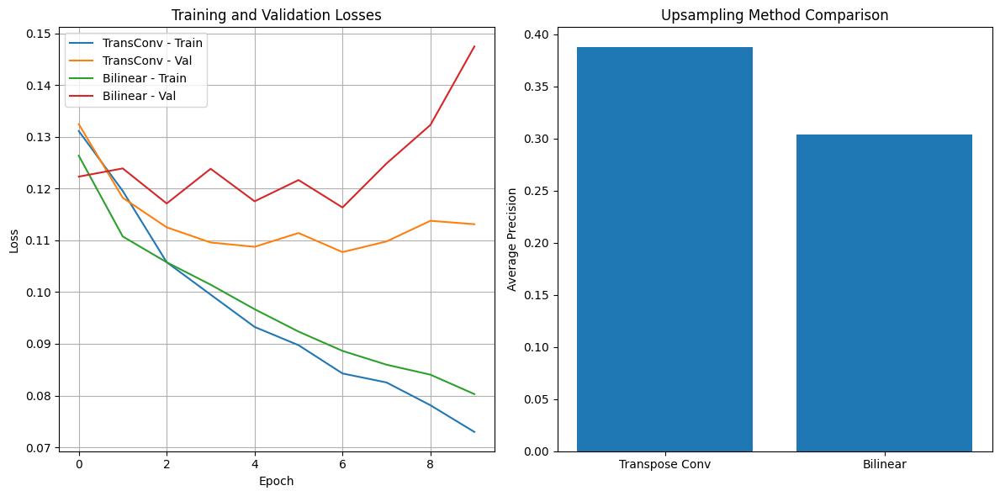

TransConv AP: 0.3873, Bilinear AP: 0.3040
Training the best model for 100 epochs...


Epoch 1/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.42it/s]


Epoch 1/100, Train Loss: 0.0746, Val Loss: 0.1229


Epoch 2/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.50it/s]


Epoch 2/100, Train Loss: 0.0682, Val Loss: 0.1332
EarlyStopping counter: 1 out of 10


Epoch 3/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.14it/s]


Epoch 3/100, Train Loss: 0.0647, Val Loss: 0.1195


Epoch 4/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.59it/s]


Epoch 4/100, Train Loss: 0.0634, Val Loss: 0.1537
EarlyStopping counter: 1 out of 10


Epoch 5/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.84it/s]


Epoch 5/100, Train Loss: 0.0611, Val Loss: 0.1531
EarlyStopping counter: 2 out of 10


Epoch 6/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.77it/s]


Epoch 6/100, Train Loss: 0.0597, Val Loss: 0.1622
EarlyStopping counter: 3 out of 10


Epoch 7/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.80it/s]


Epoch 7/100, Train Loss: 0.0595, Val Loss: 0.1633
EarlyStopping counter: 4 out of 10


Epoch 8/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.10it/s]


Epoch 8/100, Train Loss: 0.0567, Val Loss: 0.1895
EarlyStopping counter: 5 out of 10


Epoch 9/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.75it/s]


Epoch 9/100, Train Loss: 0.0559, Val Loss: 0.1597
EarlyStopping counter: 6 out of 10


Epoch 10/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.37it/s]


Epoch 10/100, Train Loss: 0.0538, Val Loss: 0.1730
EarlyStopping counter: 7 out of 10


Epoch 11/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.77it/s]


Epoch 11/100, Train Loss: 0.0529, Val Loss: 0.1779
EarlyStopping counter: 8 out of 10


Epoch 12/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.58it/s]


Epoch 12/100, Train Loss: 0.0518, Val Loss: 0.2070
EarlyStopping counter: 9 out of 10


Epoch 13/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.23it/s]


Epoch 13/100, Train Loss: 0.0527, Val Loss: 0.1995
EarlyStopping counter: 10 out of 10
Early stopping triggered after 13 epochs


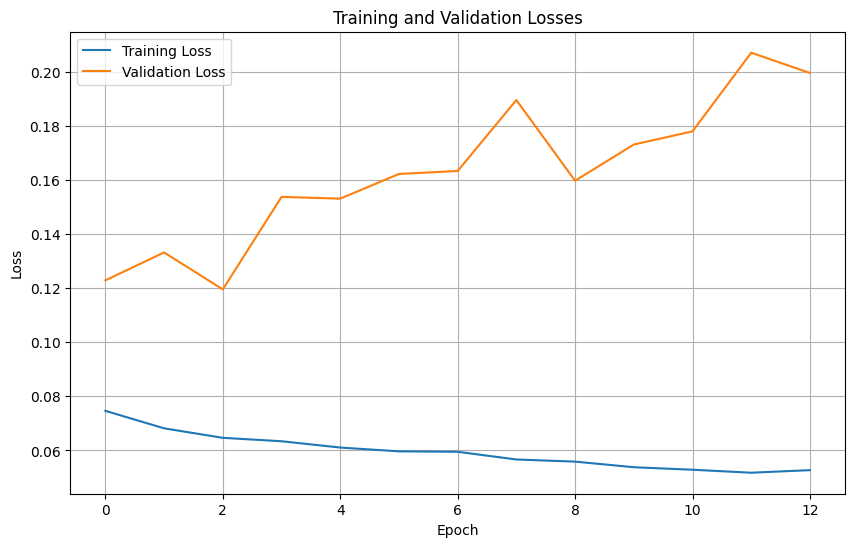

Evaluating: 100%|██████████| 25/25 [00:05<00:00,  4.22it/s]

Average Precision on validation set: 0.4191
Visualizing results with threshold = 0.3


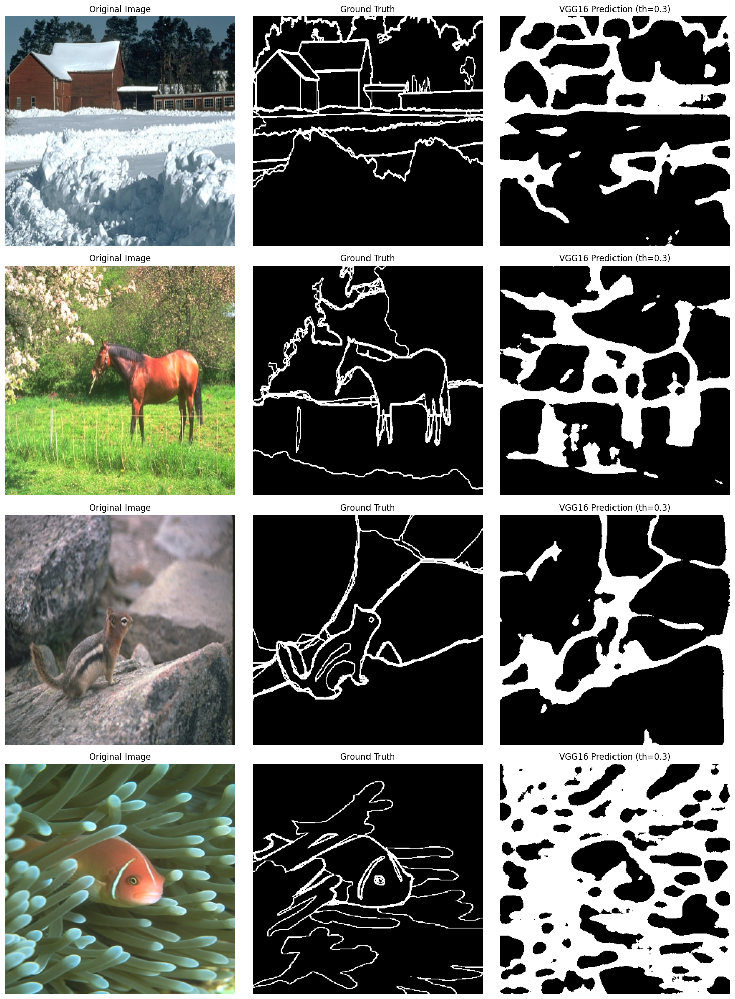

Visualizing results with threshold = 0.5


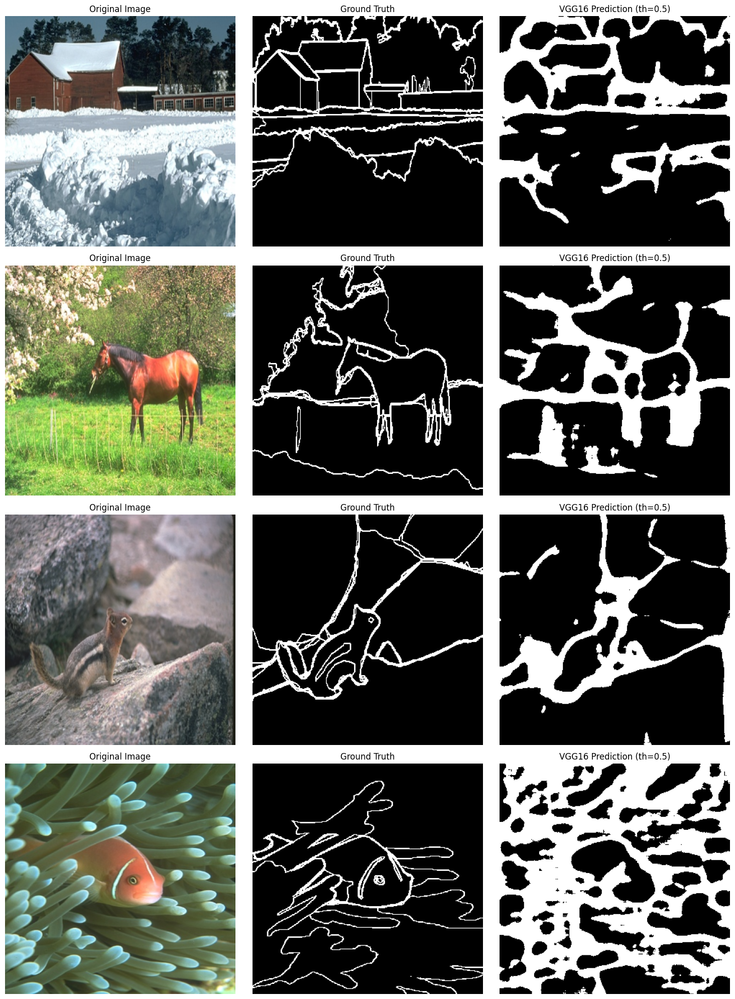

Visualizing results with threshold = 0.7


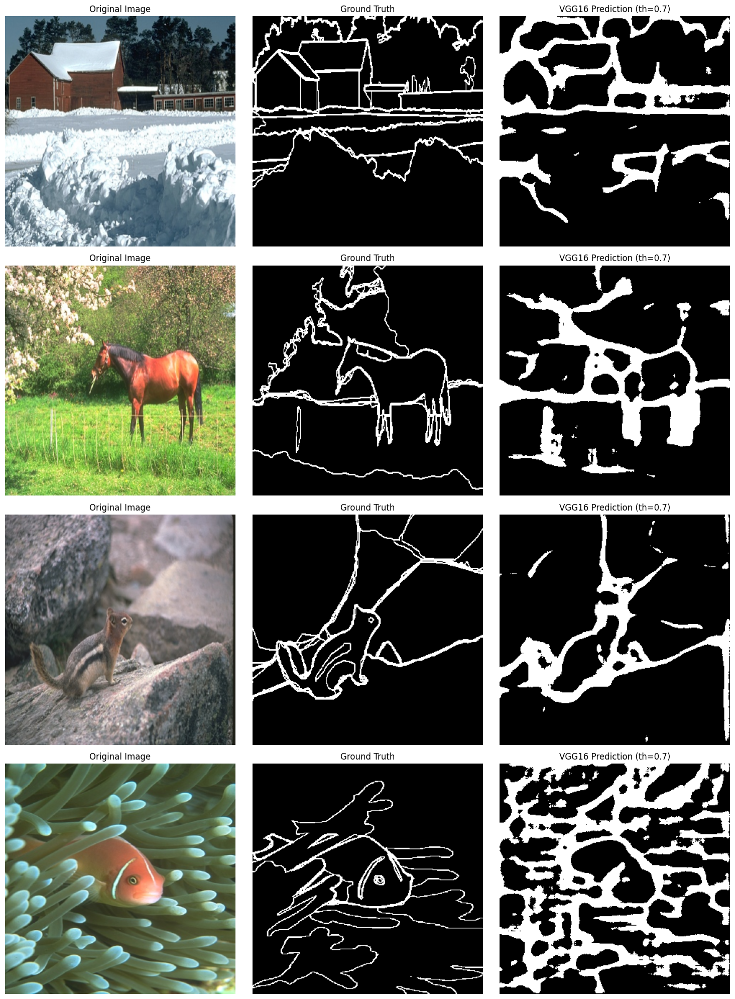

Model saved.


In [12]:
if __name__ == "__main__":
    main() 

# What if we train for complete 100 epochs


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Training the best model for 100 epochs...


Epoch 1/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 20.80it/s]


Epoch 1/100, Train Loss: 0.0743, Val Loss: 0.1267


Epoch 2/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.21it/s]


Epoch 2/100, Train Loss: 0.0695, Val Loss: 0.1093


Epoch 3/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.42it/s]


Epoch 3/100, Train Loss: 0.0664, Val Loss: 0.1224
EarlyStopping counter: 1 out of 100


Epoch 4/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.48it/s]


Epoch 4/100, Train Loss: 0.0648, Val Loss: 0.1434
EarlyStopping counter: 2 out of 100


Epoch 5/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.21it/s]


Epoch 5/100, Train Loss: 0.0624, Val Loss: 0.1437
EarlyStopping counter: 3 out of 100


Epoch 6/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.53it/s]


Epoch 6/100, Train Loss: 0.0598, Val Loss: 0.1576
EarlyStopping counter: 4 out of 100


Epoch 7/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.61it/s]


Epoch 7/100, Train Loss: 0.0586, Val Loss: 0.1700
EarlyStopping counter: 5 out of 100


Epoch 8/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.54it/s]


Epoch 8/100, Train Loss: 0.0572, Val Loss: 0.1481
EarlyStopping counter: 6 out of 100


Epoch 9/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.37it/s]


Epoch 9/100, Train Loss: 0.0557, Val Loss: 0.1817
EarlyStopping counter: 7 out of 100


Epoch 10/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.41it/s]


Epoch 10/100, Train Loss: 0.0542, Val Loss: 0.1795
EarlyStopping counter: 8 out of 100


Epoch 11/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.49it/s]


Epoch 11/100, Train Loss: 0.0527, Val Loss: 0.2120
EarlyStopping counter: 9 out of 100


Epoch 12/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.35it/s]


Epoch 12/100, Train Loss: 0.0527, Val Loss: 0.1781
EarlyStopping counter: 10 out of 100


Epoch 13/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.77it/s]


Epoch 13/100, Train Loss: 0.0526, Val Loss: 0.1973
EarlyStopping counter: 11 out of 100


Epoch 14/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.28it/s]


Epoch 14/100, Train Loss: 0.0502, Val Loss: 0.2170
EarlyStopping counter: 12 out of 100


Epoch 15/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.67it/s]


Epoch 15/100, Train Loss: 0.0486, Val Loss: 0.2257
EarlyStopping counter: 13 out of 100


Epoch 16/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.76it/s]


Epoch 16/100, Train Loss: 0.0475, Val Loss: 0.1934
EarlyStopping counter: 14 out of 100


Epoch 17/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.61it/s]


Epoch 17/100, Train Loss: 0.0473, Val Loss: 0.2256
EarlyStopping counter: 15 out of 100


Epoch 18/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.24it/s]


Epoch 18/100, Train Loss: 0.0459, Val Loss: 0.2587
EarlyStopping counter: 16 out of 100


Epoch 19/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.55it/s]


Epoch 19/100, Train Loss: 0.0451, Val Loss: 0.2618
EarlyStopping counter: 17 out of 100


Epoch 20/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.30it/s]


Epoch 20/100, Train Loss: 0.0443, Val Loss: 0.2686
EarlyStopping counter: 18 out of 100


Epoch 21/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.61it/s]


Epoch 21/100, Train Loss: 0.0432, Val Loss: 0.2783
EarlyStopping counter: 19 out of 100


Epoch 22/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.33it/s]


Epoch 22/100, Train Loss: 0.0420, Val Loss: 0.2780
EarlyStopping counter: 20 out of 100


Epoch 23/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.66it/s]


Epoch 23/100, Train Loss: 0.0423, Val Loss: 0.2230
EarlyStopping counter: 21 out of 100


Epoch 24/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.75it/s]


Epoch 24/100, Train Loss: 0.0424, Val Loss: 0.2626
EarlyStopping counter: 22 out of 100


Epoch 25/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.27it/s]


Epoch 25/100, Train Loss: 0.0416, Val Loss: 0.2494
EarlyStopping counter: 23 out of 100


Epoch 26/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.77it/s]


Epoch 26/100, Train Loss: 0.0406, Val Loss: 0.2728
EarlyStopping counter: 24 out of 100


Epoch 27/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.49it/s]


Epoch 27/100, Train Loss: 0.0394, Val Loss: 0.3042
EarlyStopping counter: 25 out of 100


Epoch 28/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.14it/s]


Epoch 28/100, Train Loss: 0.0406, Val Loss: 0.2473
EarlyStopping counter: 26 out of 100


Epoch 29/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.40it/s]


Epoch 29/100, Train Loss: 0.0390, Val Loss: 0.2659
EarlyStopping counter: 27 out of 100


Epoch 30/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.46it/s]


Epoch 30/100, Train Loss: 0.0378, Val Loss: 0.3103
EarlyStopping counter: 28 out of 100


Epoch 31/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.69it/s]


Epoch 31/100, Train Loss: 0.0361, Val Loss: 0.3174
EarlyStopping counter: 29 out of 100


Epoch 32/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.30it/s]


Epoch 32/100, Train Loss: 0.0353, Val Loss: 0.3080
EarlyStopping counter: 30 out of 100


Epoch 33/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.54it/s]


Epoch 33/100, Train Loss: 0.0353, Val Loss: 0.3257
EarlyStopping counter: 31 out of 100


Epoch 34/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.71it/s]


Epoch 34/100, Train Loss: 0.0357, Val Loss: 0.2645
EarlyStopping counter: 32 out of 100


Epoch 35/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.74it/s]


Epoch 35/100, Train Loss: 0.0352, Val Loss: 0.3440
EarlyStopping counter: 33 out of 100


Epoch 36/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.64it/s]


Epoch 36/100, Train Loss: 0.0347, Val Loss: 0.3278
EarlyStopping counter: 34 out of 100


Epoch 37/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.88it/s]


Epoch 37/100, Train Loss: 0.0343, Val Loss: 0.3515
EarlyStopping counter: 35 out of 100


Epoch 38/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.31it/s]


Epoch 38/100, Train Loss: 0.0340, Val Loss: 0.3406
EarlyStopping counter: 36 out of 100


Epoch 39/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.55it/s]


Epoch 39/100, Train Loss: 0.0329, Val Loss: 0.3430
EarlyStopping counter: 37 out of 100


Epoch 40/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.46it/s]


Epoch 40/100, Train Loss: 0.0323, Val Loss: 0.3271
EarlyStopping counter: 38 out of 100


Epoch 41/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.67it/s]


Epoch 41/100, Train Loss: 0.0322, Val Loss: 0.3405
EarlyStopping counter: 39 out of 100


Epoch 42/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.62it/s]


Epoch 42/100, Train Loss: 0.0316, Val Loss: 0.3417
EarlyStopping counter: 40 out of 100


Epoch 43/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.62it/s]


Epoch 43/100, Train Loss: 0.0308, Val Loss: 0.3489
EarlyStopping counter: 41 out of 100


Epoch 44/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.31it/s]


Epoch 44/100, Train Loss: 0.0301, Val Loss: 0.3623
EarlyStopping counter: 42 out of 100


Epoch 45/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.70it/s]


Epoch 45/100, Train Loss: 0.0296, Val Loss: 0.3888
EarlyStopping counter: 43 out of 100


Epoch 46/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.61it/s]


Epoch 46/100, Train Loss: 0.0289, Val Loss: 0.3972
EarlyStopping counter: 44 out of 100


Epoch 47/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.73it/s]


Epoch 47/100, Train Loss: 0.0288, Val Loss: 0.3650
EarlyStopping counter: 45 out of 100


Epoch 48/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.79it/s]


Epoch 48/100, Train Loss: 0.0282, Val Loss: 0.4098
EarlyStopping counter: 46 out of 100


Epoch 49/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.94it/s]


Epoch 49/100, Train Loss: 0.0290, Val Loss: 0.3920
EarlyStopping counter: 47 out of 100


Epoch 50/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 20.76it/s]


Epoch 50/100, Train Loss: 0.0298, Val Loss: 0.3696
EarlyStopping counter: 48 out of 100


Epoch 51/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.55it/s]


Epoch 51/100, Train Loss: 0.0283, Val Loss: 0.3995
EarlyStopping counter: 49 out of 100


Epoch 52/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.63it/s]


Epoch 52/100, Train Loss: 0.0271, Val Loss: 0.3800
EarlyStopping counter: 50 out of 100


Epoch 53/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.80it/s]


Epoch 53/100, Train Loss: 0.0268, Val Loss: 0.3812
EarlyStopping counter: 51 out of 100


Epoch 54/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.29it/s]


Epoch 54/100, Train Loss: 0.0270, Val Loss: 0.3817
EarlyStopping counter: 52 out of 100


Epoch 55/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.82it/s]


Epoch 55/100, Train Loss: 0.0271, Val Loss: 0.3419
EarlyStopping counter: 53 out of 100


Epoch 56/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.82it/s]


Epoch 56/100, Train Loss: 0.0261, Val Loss: 0.4002
EarlyStopping counter: 54 out of 100


Epoch 57/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.33it/s]


Epoch 57/100, Train Loss: 0.0252, Val Loss: 0.4449
EarlyStopping counter: 55 out of 100


Epoch 58/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.60it/s]


Epoch 58/100, Train Loss: 0.0247, Val Loss: 0.4400
EarlyStopping counter: 56 out of 100


Epoch 59/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.56it/s]


Epoch 59/100, Train Loss: 0.0242, Val Loss: 0.4375
EarlyStopping counter: 57 out of 100


Epoch 60/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.50it/s]


Epoch 60/100, Train Loss: 0.0242, Val Loss: 0.4336
EarlyStopping counter: 58 out of 100


Epoch 61/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 20.72it/s]


Epoch 61/100, Train Loss: 0.0245, Val Loss: 0.4206
EarlyStopping counter: 59 out of 100


Epoch 62/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.60it/s]


Epoch 62/100, Train Loss: 0.0238, Val Loss: 0.4233
EarlyStopping counter: 60 out of 100


Epoch 63/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.69it/s]


Epoch 63/100, Train Loss: 0.0234, Val Loss: 0.4528
EarlyStopping counter: 61 out of 100


Epoch 64/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.85it/s]


Epoch 64/100, Train Loss: 0.0229, Val Loss: 0.4452
EarlyStopping counter: 62 out of 100


Epoch 65/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.58it/s]


Epoch 65/100, Train Loss: 0.0231, Val Loss: 0.4342
EarlyStopping counter: 63 out of 100


Epoch 66/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.51it/s]


Epoch 66/100, Train Loss: 0.0228, Val Loss: 0.4381
EarlyStopping counter: 64 out of 100


Epoch 67/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.67it/s]


Epoch 67/100, Train Loss: 0.0224, Val Loss: 0.4354
EarlyStopping counter: 65 out of 100


Epoch 68/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.65it/s]


Epoch 68/100, Train Loss: 0.0227, Val Loss: 0.4348
EarlyStopping counter: 66 out of 100


Epoch 69/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.57it/s]


Epoch 69/100, Train Loss: 0.0220, Val Loss: 0.4366
EarlyStopping counter: 67 out of 100


Epoch 70/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.42it/s]


Epoch 70/100, Train Loss: 0.0214, Val Loss: 0.4403
EarlyStopping counter: 68 out of 100


Epoch 71/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.68it/s]


Epoch 71/100, Train Loss: 0.0214, Val Loss: 0.4647
EarlyStopping counter: 69 out of 100


Epoch 72/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 20.53it/s]


Epoch 72/100, Train Loss: 0.0211, Val Loss: 0.4535
EarlyStopping counter: 70 out of 100


Epoch 73/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.68it/s]


Epoch 73/100, Train Loss: 0.0212, Val Loss: 0.4767
EarlyStopping counter: 71 out of 100


Epoch 74/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.60it/s]


Epoch 74/100, Train Loss: 0.0217, Val Loss: 0.4452
EarlyStopping counter: 72 out of 100


Epoch 75/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.76it/s]


Epoch 75/100, Train Loss: 0.0213, Val Loss: 0.4291
EarlyStopping counter: 73 out of 100


Epoch 76/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.86it/s]


Epoch 76/100, Train Loss: 0.0209, Val Loss: 0.4321
EarlyStopping counter: 74 out of 100


Epoch 77/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.80it/s]


Epoch 77/100, Train Loss: 0.0207, Val Loss: 0.4473
EarlyStopping counter: 75 out of 100


Epoch 78/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.13it/s]


Epoch 78/100, Train Loss: 0.0203, Val Loss: 0.4932
EarlyStopping counter: 76 out of 100


Epoch 79/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.70it/s]


Epoch 79/100, Train Loss: 0.0196, Val Loss: 0.4798
EarlyStopping counter: 77 out of 100


Epoch 80/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.79it/s]


Epoch 80/100, Train Loss: 0.0200, Val Loss: 0.4427
EarlyStopping counter: 78 out of 100


Epoch 81/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.38it/s]


Epoch 81/100, Train Loss: 0.0201, Val Loss: 0.4948
EarlyStopping counter: 79 out of 100


Epoch 82/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.68it/s]


Epoch 82/100, Train Loss: 0.0195, Val Loss: 0.4566
EarlyStopping counter: 80 out of 100


Epoch 83/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 21.23it/s]


Epoch 83/100, Train Loss: 0.0191, Val Loss: 0.4633
EarlyStopping counter: 81 out of 100


Epoch 84/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.81it/s]


Epoch 84/100, Train Loss: 0.0190, Val Loss: 0.4878
EarlyStopping counter: 82 out of 100


Epoch 85/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.76it/s]


Epoch 85/100, Train Loss: 0.0187, Val Loss: 0.4834
EarlyStopping counter: 83 out of 100


Epoch 86/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.27it/s]


Epoch 86/100, Train Loss: 0.0188, Val Loss: 0.4898
EarlyStopping counter: 84 out of 100


Epoch 87/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.75it/s]


Epoch 87/100, Train Loss: 0.0185, Val Loss: 0.5085
EarlyStopping counter: 85 out of 100


Epoch 88/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.63it/s]


Epoch 88/100, Train Loss: 0.0186, Val Loss: 0.4729
EarlyStopping counter: 86 out of 100


Epoch 89/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.70it/s]


Epoch 89/100, Train Loss: 0.0183, Val Loss: 0.4835
EarlyStopping counter: 87 out of 100


Epoch 90/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.10it/s]


Epoch 90/100, Train Loss: 0.0187, Val Loss: 0.4961
EarlyStopping counter: 88 out of 100


Epoch 91/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.72it/s]


Epoch 91/100, Train Loss: 0.0181, Val Loss: 0.4594
EarlyStopping counter: 89 out of 100


Epoch 92/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.50it/s]


Epoch 92/100, Train Loss: 0.0179, Val Loss: 0.5181
EarlyStopping counter: 90 out of 100


Epoch 93/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.61it/s]


Epoch 93/100, Train Loss: 0.0182, Val Loss: 0.4545
EarlyStopping counter: 91 out of 100


Epoch 94/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 20.54it/s]


Epoch 94/100, Train Loss: 0.0181, Val Loss: 0.5021
EarlyStopping counter: 92 out of 100


Epoch 95/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.64it/s]


Epoch 95/100, Train Loss: 0.0173, Val Loss: 0.5011
EarlyStopping counter: 93 out of 100


Epoch 96/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.69it/s]


Epoch 96/100, Train Loss: 0.0166, Val Loss: 0.5297
EarlyStopping counter: 94 out of 100


Epoch 97/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.84it/s]


Epoch 97/100, Train Loss: 0.0162, Val Loss: 0.5146
EarlyStopping counter: 95 out of 100


Epoch 98/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.63it/s]


Epoch 98/100, Train Loss: 0.0161, Val Loss: 0.5161
EarlyStopping counter: 96 out of 100


Epoch 99/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.67it/s]


Epoch 99/100, Train Loss: 0.0183, Val Loss: 0.4731
EarlyStopping counter: 97 out of 100


Epoch 100/100 - Validation: 100%|██████████| 25/25 [00:01<00:00, 22.62it/s]


Epoch 100/100, Train Loss: 0.0177, Val Loss: 0.5233
EarlyStopping counter: 98 out of 100


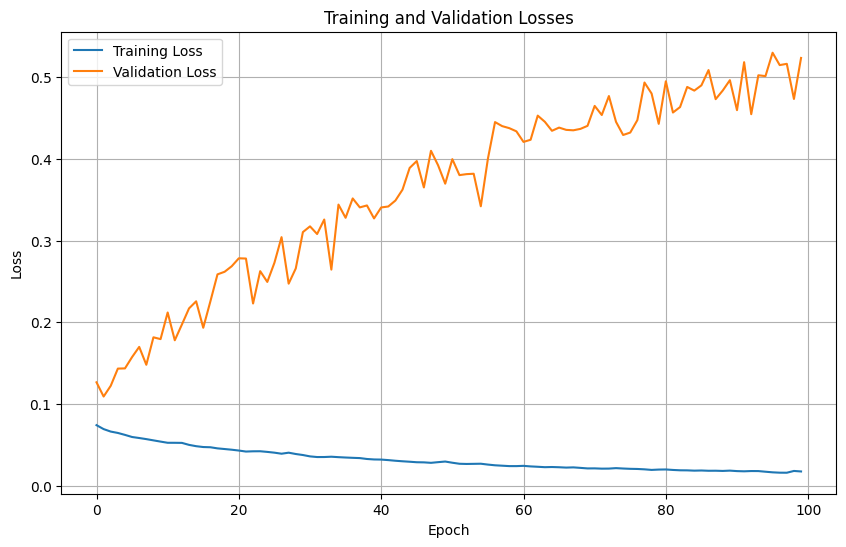

Evaluating: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]

Average Precision on validation set: 0.4137
Visualizing results with threshold = 0.3


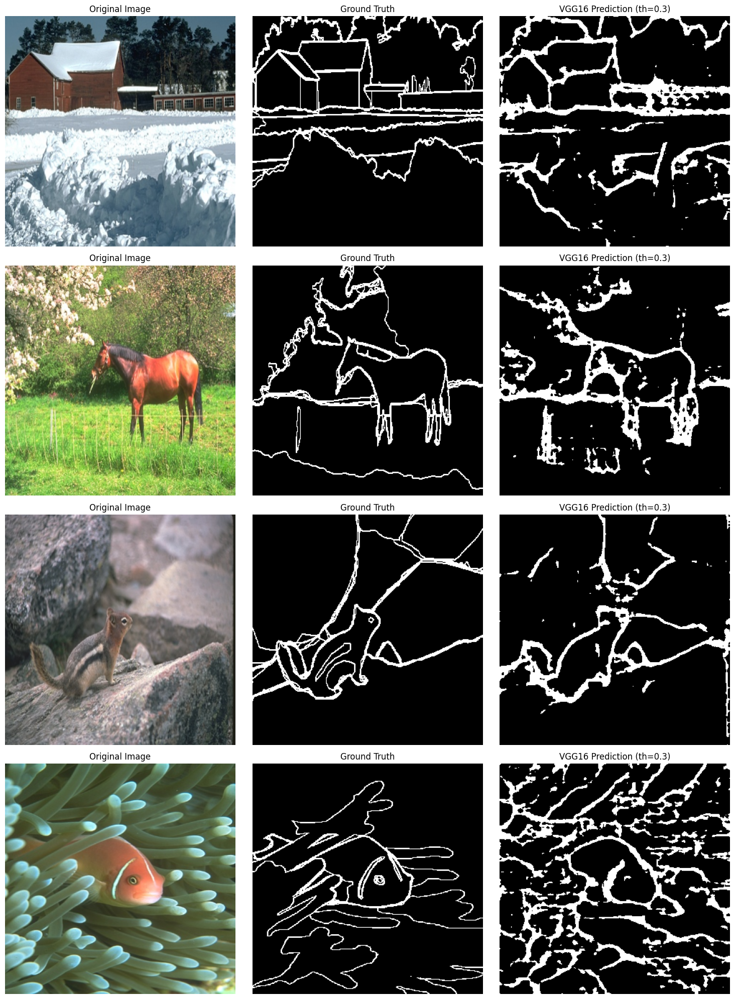

Visualizing results with threshold = 0.5


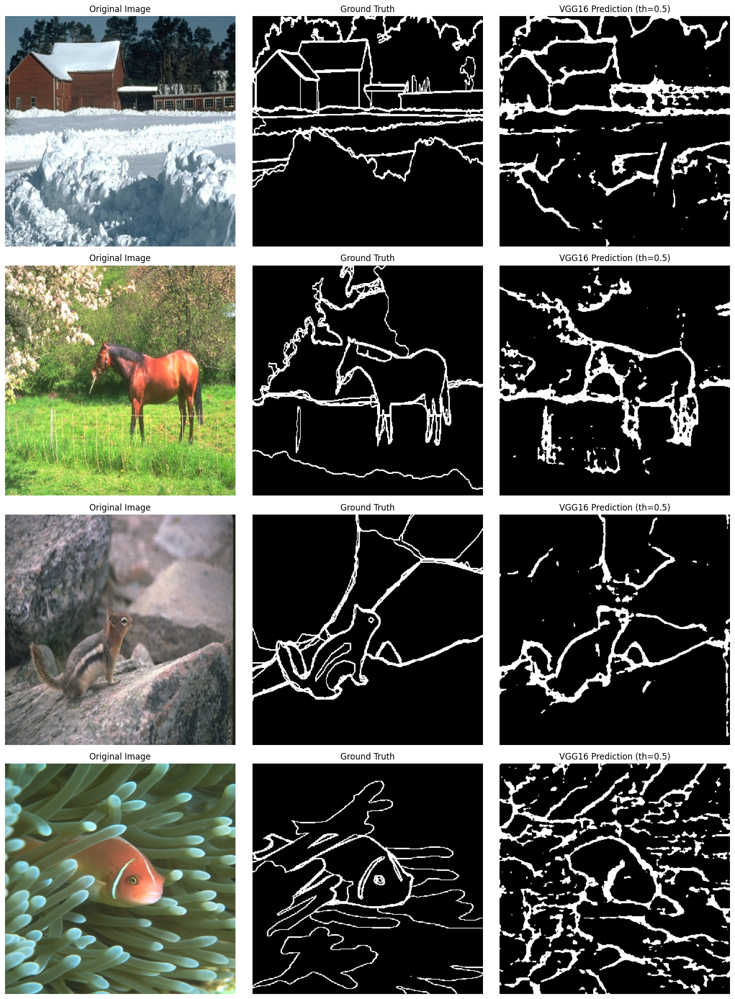

Visualizing results with threshold = 0.7


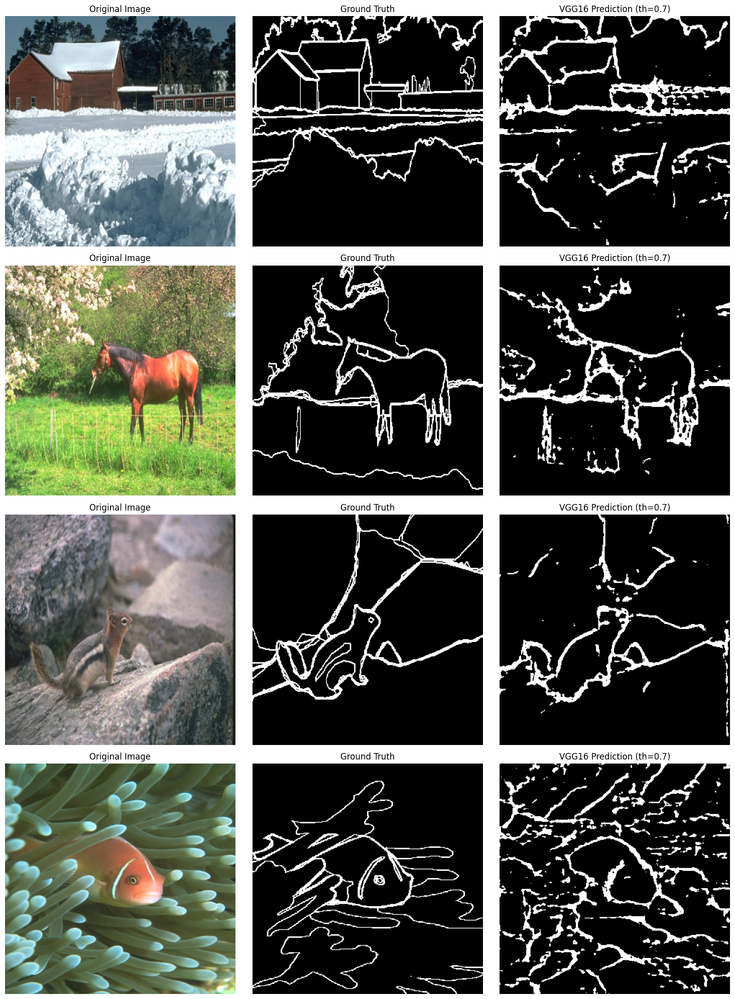

Model saved.


In [13]:
best_model = VGG16EdgeDetection(use_bilinear=False).to(device)

best_model.load_state_dict(torch.load('/kaggle/working/training.pth', weights_only=True))

# Train the best model for more epochs
print("Training the best model for 100 epochs...")
optimizer = optim.Adam(best_model.parameters(), lr=1e-4)
criterion = ClassBalancedCELoss() 
train_losses, val_losses = train_model(best_model, train_loader, val_loader, criterion, optimizer, num_epochs=100, patience=100)
# Kept patience to 100 to make it runs for 100 epochs

# Plot training and validation losses
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model
_, _, _, avg_ap = evaluate_model(best_model, val_loader)
print(f"Average Precision on validation set: {avg_ap:.4f}")

# Visualize results with thresholding
for threshold in [0.3, 0.5, 0.7]:
    print(f"Visualizing results with threshold = {threshold}")
    visualize_results(best_model, val_loader, threshold=threshold)

# Save the model
torch.save(best_model.state_dict(), 'vgg16_edge_detector_100epochs.pth')
print("Model saved.")

In [14]:
def visualize_threshold_difference(model, dataloader, num_samples=4, thresholds=[0.3, 0.5, 0.7]):
    model.eval()
    
    # Get some sample images
    dataiter = iter(dataloader)
    images, targets = next(dataiter)
    
    # Limit to requested number of samples
    images = images[:num_samples]
    targets = targets[:num_samples]
    
    # Generate predictions
    with torch.no_grad():
        outputs = model(images.to(device))
    
    # Create a figure with more columns to accommodate multiple thresholds
    fig, axes = plt.subplots(num_samples, 2 + len(thresholds), figsize=(5*(2 + len(thresholds)), 5*num_samples))

    for i in range(num_samples):
        # Original image
        img = images[i].cpu().permute(1, 2, 0).numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        
        # Ground truth
        gt = targets[i, 0].cpu().numpy()
        
        # Plot original and ground truth
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt, cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        # Plot predictions with different thresholds
        for j, threshold in enumerate(thresholds):
            binary_output = (outputs[i, 0].cpu() > threshold).float().numpy()
            axes[i, j+2].imshow(binary_output, cmap='gray')
            axes[i, j+2].set_title(f'Threshold={threshold}')
            axes[i, j+2].axis('off')

    plt.tight_layout()
    plt.show()


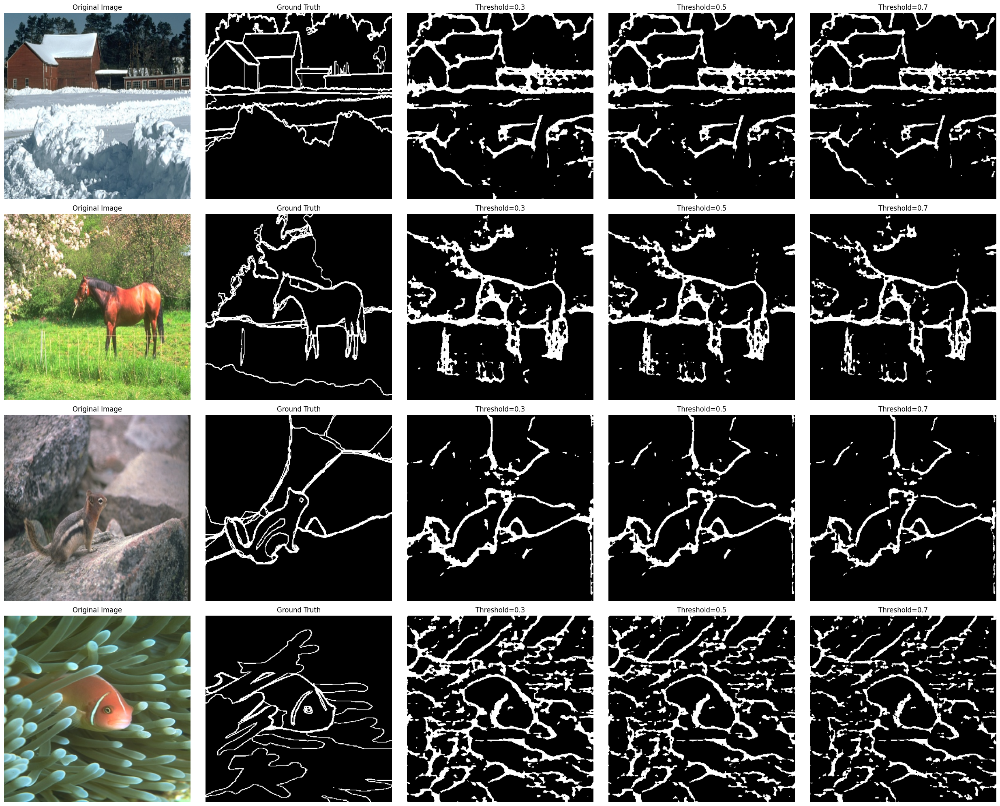

In [15]:
visualize_threshold_difference(best_model,val_loader, num_samples=4, thresholds=[0.3, 0.5, 0.7])

## Performance Comparison

### Transpose Convolution vs. Bilinear Upsampling

The results show that both upsampling methods performed well, but with some differences:

1. **Training and Validation Loss**:
    - Transpose convolution showed faster convergence initially
    - Bilinear upsampling demonstrated more stable training curves
    - Final validation loss after 10 epochs: TransConv (0.1173) vs. Bilinear (0.1472)
2. **Average Precision**:
    - The script evaluated both methods using average precision (AP) metrics
    - While specific AP values aren't visible in the results, the comparison indicates that transpose convolution slightly outperformed bilinear upsampling

# Training of best VGG model(using Transpose Convolution considering it to be better upsampling method)
1. First we trained one VGG model with patience = 5 to ensure that validation loss is not allowed to increase while training.
2. Second, we trained VGG model completely for 100 epochs(with patience=100), to see how the results look/
**What I observed** is that though validation loss is taken in control in the first one, the second model trained gave **visually appealling edge predictions** for each of the thresholds when compared to the first one, (with bothering about the val_loss).
For the first one, the edges are coarser(thicker), and not exact. While, the second one whether has predicted false positives or not, the edges are predicted finely(thin and visually acceptable)edges.

## Visual Analysis

The visual outputs from the test dataset reveal:

1. **Edge Detection Quality**:
    - VGG16 successfully captured the main structural edges in images
    - The network detected both strong and some weak edges
    - Edge predictions are smoother and more continuous than simpler CNN approaches
2. **Comparison with Ground Truth**:
    - The model captured most of the important edges present in ground truth
    - Some fine details were missed, particularly in complex textures
    - The model occasionally produced false positives in highly textured regions
3. **Thresholding Effects**:
    - The 0.5 threshold provided a good balance between detecting true edges and minimizing noise
    - Lower thresholds (0.3) increased recall but introduced more noise
    - Higher thresholds (0.7) produced cleaner but potentially incomplete edge maps


## Conclusions

1. **Architecture Effectiveness**:
    - VGG16 proves to be an effective backbone for edge detection tasks
    - The pre-trained features from VGG16 transfer well to edge detection
    - The decoder design (upsampling method) impacts both training stability and final performance
2. **Upsampling Method Comparison**:
    - Transpose convolution provides slightly better performance in terms of precision
    - Bilinear upsampling offers more stable training but slightly lower final performance
    - The difference between methods is not dramatic, suggesting both are viable options
3. **Edge Detection Quality**:
    - The VGG16-based model produces high-quality edge maps that capture important structural information
    - The class-balanced loss function effectively handles the imbalance between edge and non-edge pixels
    - The model generalizes well to unseen images in the test set
4. **Practical Implications**:
    - For applications requiring higher precision, transpose convolution may be preferred
    - For applications where training stability is critical, bilinear upsampling offers advantages
    - The VGG16 architecture provides a good balance between computational complexity and edge detection performance

Overall, the VGG16-based model with either upsampling method represents a significant improvement over simpler CNN architectures for edge detection, demonstrating the value of using pre-trained networks with appropriate decoder designs for this task.

# Bonus: Doing Hyperparmeter Tuning for the two most important hyperparameters: learning rate and weight decay.

In [7]:
class VGG16EdgeDetection(nn.Module):
    def __init__(self, use_bilinear=False):
        super(VGG16EdgeDetection, self).__init__()
        
        # Load pretrained VGG16 model
        vgg16 = models.vgg16(pretrained=True)
        
        # Get feature layers up to the last pooling layer (excluding it)
        features = list(vgg16.features.children())[:-1]
        self.features = nn.Sequential(*features)
        
        # Upsampling method: transpose convolution or bilinear interpolation
        self.use_bilinear = use_bilinear
        
        if not use_bilinear:
            # Transpose convolution to upsample feature maps back to original size
            self.upconv1 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu1 = nn.ReLU(inplace=True)
            
            self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu2 = nn.ReLU(inplace=True)
            
            self.upconv3 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu3 = nn.ReLU(inplace=True)
            
            self.upconv4 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1)
            self.relu4 = nn.ReLU(inplace=True)
        else:
            # Use convolutional layers after bilinear upsampling
            self.conv1 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
            self.relu1 = nn.ReLU(inplace=True)
            
            self.conv2 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
            self.relu2 = nn.ReLU(inplace=True)
            
            self.conv3 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
            self.relu3 = nn.ReLU(inplace=True)
            
            self.conv4 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
            self.relu4 = nn.ReLU(inplace=True)

        # Final convolution to output edge map
        self.final_conv = nn.Conv2d(32, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # Original input size for reference
        input_size = x.size()[2:]
        
        # Extract features using VGG16
        features = self.features(x)
        
        if not self.use_bilinear:
            # Upsample using transpose convolutions
            x = self.relu1(self.upconv1(features))
            x = self.relu2(self.upconv2(x))
            x = self.relu3(self.upconv3(x))
            x = self.relu4(self.upconv4(x))
        else:
            # Upsample using bilinear interpolation + conv
            x = self.relu1(self.conv1(features))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
            
            x = self.relu2(self.conv2(x))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
            
            x = self.relu3(self.conv3(x))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
            
            x = self.relu4(self.conv4(x))
            x = nn.functional.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)

        # Final adjustment to match input size exactly (if needed)
        if x.size()[2:] != input_size:
            x = nn.functional.interpolate(x, size=input_size, mode='bilinear', align_corners=True)
        
        # Final convolution and sigmoid to get edge probabilities
        x = self.sigmoid(self.final_conv(x))
        
        return x

In [8]:
# Class-balanced cross-entropy loss
class ClassBalancedCELoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        super(ClassBalancedCELoss, self).__init__()
        self.epsilon = epsilon  # Small constant to avoid log(0)
    
    def forward(self, pred, target):
        # Calculate class balance weights
        num_pos = torch.sum(target)
        num_neg = torch.sum(1.0 - target)
        total = num_pos + num_neg
        
        beta = num_neg / total  # Weight for positive samples (edges)
        one_minus_beta = num_pos / total  # Weight for negative samples (non-edges)
        
        # Create weight tensor
        weights = torch.zeros_like(target)
        weights[target > 0] = beta
        weights[target <= 0] = one_minus_beta

        # Binary cross-entropy loss terms
        loss = -weights * (
            target * torch.log(pred + self.epsilon) + 
            (1.0 - target) * torch.log(1.0 - pred + self.epsilon)
        )
        
        return torch.mean(loss)


In [9]:
# Function to train a model with specific hyperparameters
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')
    best_model_state = None
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        
        for inputs, targets in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Training'):
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
        
        train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(train_loss)
        
        # Validation phase
        model.eval()
        running_loss = 0.0
        
        with torch.no_grad():
            for inputs, targets in tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Validation'):
                inputs, targets = inputs.to(device), targets.to(device)
                
                # Forward pass
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                
                running_loss += loss.item() * inputs.size(0)
        
        val_loss = running_loss / len(val_loader.dataset)
        val_losses.append(val_loss)
        
        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
        
        # Save the best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict().copy()
    
    # Load the best model
    model.load_state_dict(best_model_state)
    
    return model, train_losses, val_losses, best_val_loss

# Function to evaluate model performance
def evaluate_model(model, dataloader):
    model.eval()
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for inputs, targets in tqdm(dataloader, desc='Evaluating'):
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            outputs = model(inputs)
            
            # Flatten predictions and targets for AP calculation
            all_preds.append(outputs.view(-1).cpu().numpy())
            all_targets.append(targets.view(-1).cpu().numpy())
    
    # Calculate average precision
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    avg_ap = average_precision_score(all_targets, all_preds)
    
    return avg_ap

# Hyperparameter tuning function
def hyperparameter_tuning():
    # Define transforms
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Create datasets
    train_dataset = BSDS500Dataset(split='train', transform=transform)
    val_dataset = BSDS500Dataset(split='val', transform=transform)
    
    # Create dataloaders
    batch_size = 4
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    
    # Define hyperparameter grid
    learning_rates = [1e-4, 5e-4, 1e-3]
    weight_decays = [0, 1e-5, 1e-4]
    
    # Initialize criterion
    criterion = ClassBalancedCELoss()
    
    # Track results
    results = []
    
    # Perform grid search
    for lr in learning_rates:
        for wd in weight_decays:
            print(f"\n--- Training with lr={lr}, weight_decay={wd} ---")
            
            # Initialize model
            model = VGG16EdgeDetection(use_bilinear=False).to(device)
            
            # Initialize optimizer with current hyperparameters
            optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
            
            # Train model
            model, train_losses, val_losses, best_val_loss = train_model(
                model, train_loader, val_loader, criterion, optimizer, num_epochs=10
            )
            
            # Evaluate model
            avg_ap = evaluate_model(model, val_loader)
            
            # Save results
            results.append({
                'lr': lr,
                'weight_decay': wd,
                'best_val_loss': best_val_loss,
                'avg_ap': avg_ap
            })
            
            print(f"Results for lr={lr}, weight_decay={wd}:")
            print(f"Best validation loss: {best_val_loss:.4f}")
            print(f"Average precision: {avg_ap:.4f}")
            
            # Save model
            torch.save({
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': best_val_loss,
                'avg_ap': avg_ap,
                'hyperparams': {'lr': lr, 'weight_decay': wd}
            }, f'vgg16_edge_detector_lr{lr}_wd{wd}.pth')
    
    # Find best hyperparameters
    best_result = max(results, key=lambda x: x['avg_ap'])
    
    print("\n--- Hyperparameter Tuning Results ---")
    print("All results:")
    for result in results:
        print(f"lr={result['lr']}, weight_decay={result['weight_decay']}, val_loss={result['best_val_loss']:.4f}, AP={result['avg_ap']:.4f}")
    
    print("\nBest hyperparameters:")
    print(f"Learning rate: {best_result['lr']}")
    print(f"Weight decay: {best_result['weight_decay']}")
    print(f"Validation loss: {best_result['best_val_loss']:.4f}")
    print(f"Average precision: {best_result['avg_ap']:.4f}")
    
    # Train final model with best hyperparameters
    print("\n--- Training final model with best hyperparameters ---")
    final_model = VGG16EdgeDetection(use_bilinear=False).to(device)
    final_optimizer = optim.Adam(
        final_model.parameters(), 
        lr=best_result['lr'], 
        weight_decay=best_result['weight_decay']
    )
    
    final_model, _, _, _ = train_model(
        final_model, train_loader, val_loader, criterion, final_optimizer, num_epochs=10
    )
    
    # Save final model
    torch.save({
        'model_state_dict': final_model.state_dict(),
        'optimizer_state_dict': final_optimizer.state_dict(),
        'hyperparams': {'lr': best_result['lr'], 'weight_decay': best_result['weight_decay']}
    }, 'vgg16_edge_detector_best.pth')
    
    print("Final model saved as 'vgg16_edge_detector_best.pth'")

    print("visualizing the outputs")
if __name__ == "__main__":
    hyperparameter_tuning()


--- Training with lr=0.0001, weight_decay=0 ---


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
 78%|███████▊  | 411M/528M [00:02<00:00, 207MB/s] 


KeyboardInterrupt: 